# Chapter 3 Applied: R

## Problem 8

In [1]:
library(ISLR)

In [2]:
attach(Auto)

### 8.a

In [3]:
lm.fit <- lm(mpg ~ horsepower)
summary(lm.fit)


Call:
lm(formula = mpg ~ horsepower)

Residuals:
     Min       1Q   Median       3Q      Max 
-13.5710  -3.2592  -0.3435   2.7630  16.9240 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 39.935861   0.717499   55.66   <2e-16 ***
horsepower  -0.157845   0.006446  -24.49   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 4.906 on 390 degrees of freedom
Multiple R-squared:  0.6059,	Adjusted R-squared:  0.6049 
F-statistic: 599.7 on 1 and 390 DF,  p-value: < 2.2e-16


From the output of our linear regression of `mpg` onto `horsepower`, we can observe the following:

1. There is a non-trivial linear relationship between `horsepower` and `mpg`. I say "non-trivial" because measurements of the F-statistic (599.7 on 1) and the associated p-value (< 2.2e-16) indicate that the observed relationship is likely not the product of random chance in a null hypothesis scenario
2. The $R^2$ of the fit was 0.6059, which means that 60.59% of all variance in `mpg` can be explained by our linear model and the associated `horsepower`.
3. A negative coefficient in our linear fit indicates that increasing `horsepower` results in a decrease in `mpg`.

For a horsepower of 98, we will see the following:

In [4]:
predict(lm.fit, data.frame(horsepower=c(98)), interval="confidence")

,fit,lwr,upr
1,24.46708,23.97308,24.96108


In [5]:
predict(lm.fit, data.frame(horsepower=c(98)), interval="prediction")

,fit,lwr,upr
1,24.46708,14.80940,34.12476


### 8.b

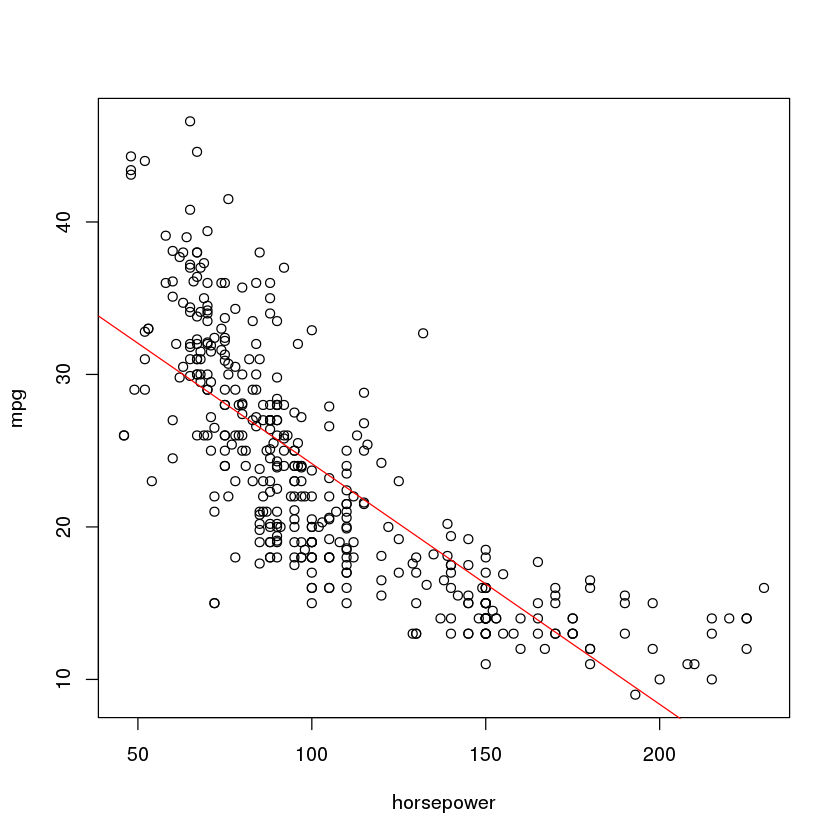

In [6]:
plot(horsepower, mpg)
abline(lm.fit, col="red")

### 8.c

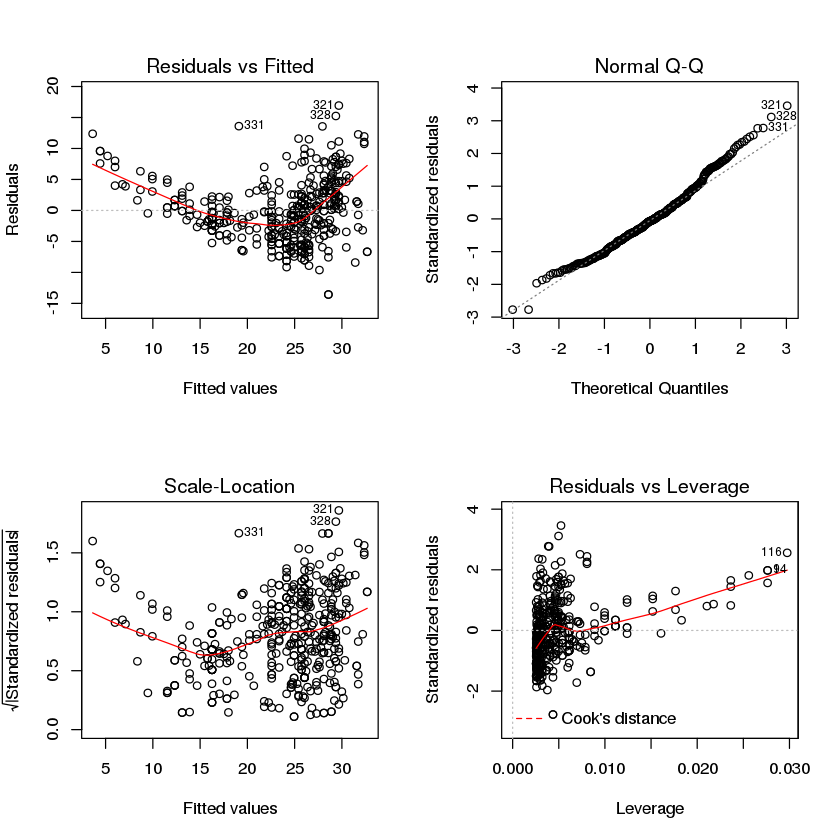

In [7]:
par(mfrow=c(2, 2))
plot(lm.fit)

First, on the residuals fit: there is a clear non-linear behavior. We expect to see fairly small, symmetrically distributed residuals, but there is definitely some consistent misbehavior for small and large predicted values.

Second, while there are some outliers (as seen in the bottom two plots, with standardized / studentized residuals), the more concerning issue is the number of high leverage points. We've discussed "problematic" leverage points as those with a leverage value much larger than the leverage mean ($(p + 1) / n$). For this set, $p=1$ and $n=360$, so the problematic range is 0.005. Many of the right-most poitns on the 4th plot satisfy this criterion.

## Problem 9

### 9.a

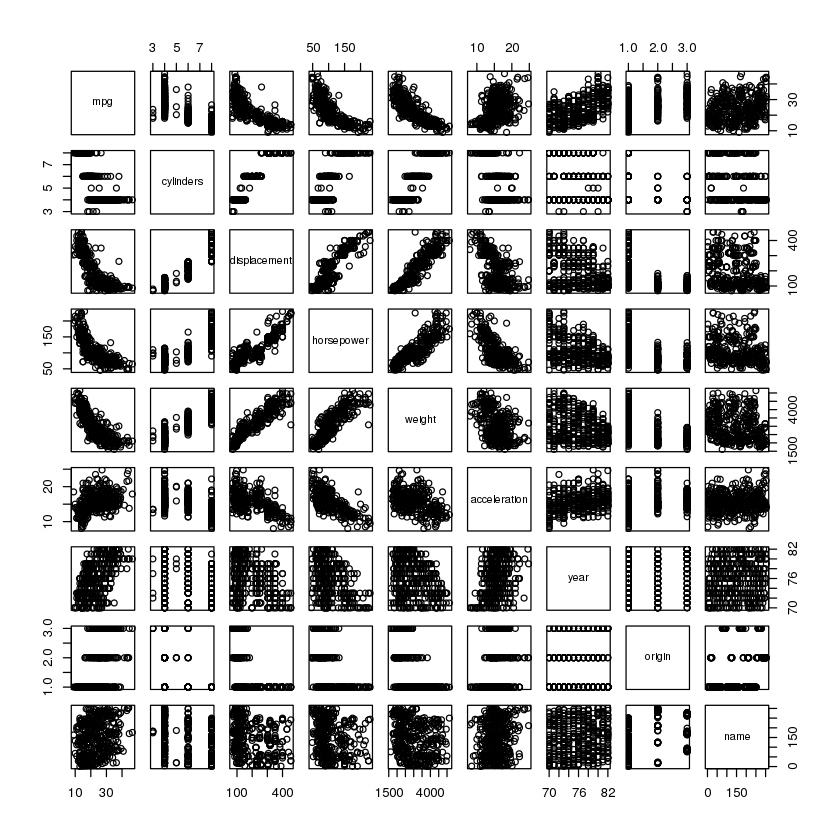

In [8]:
pairs(Auto)

### 9.b

In [9]:
cor(subset(Auto, select=-name))

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin
mpg,1.0000000,-0.7776175,-0.8051269,-0.7784268,-0.8322442,0.4233285,0.5805410,0.5652088
cylinders,-0.7776175,1.0000000,0.9508233,0.8429834,0.8975273,-0.5046834,-0.3456474,-0.5689316
displacement,-0.8051269,0.9508233,1.0000000,0.8972570,0.9329944,-0.5438005,-0.3698552,-0.6145351
horsepower,-0.7784268,0.8429834,0.8972570,1.0000000,0.8645377,-0.6891955,-0.4163615,-0.4551715
weight,-0.8322442,0.8975273,0.9329944,0.8645377,1.0000000,-0.4168392,-0.3091199,-0.5850054
acceleration,0.4233285,-0.5046834,-0.5438005,-0.6891955,-0.4168392,1.0000000,0.2903161,0.2127458
year,0.5805410,-0.3456474,-0.3698552,-0.4163615,-0.3091199,0.2903161,1.0000000,0.1815277
origin,0.5652088,-0.5689316,-0.6145351,-0.4551715,-0.5850054,0.2127458,0.1815277,1.0000000


### 9.c

In [10]:
lm.fit <- lm(mpg ~ . - name, data=Auto)
summary(lm.fit)


Call:
lm(formula = mpg ~ . - name, data = Auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-9.5903 -2.1565 -0.1169  1.8690 13.0604 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -17.218435   4.644294  -3.707  0.00024 ***
cylinders     -0.493376   0.323282  -1.526  0.12780    
displacement   0.019896   0.007515   2.647  0.00844 ** 
horsepower    -0.016951   0.013787  -1.230  0.21963    
weight        -0.006474   0.000652  -9.929  < 2e-16 ***
acceleration   0.080576   0.098845   0.815  0.41548    
year           0.750773   0.050973  14.729  < 2e-16 ***
origin         1.426141   0.278136   5.127 4.67e-07 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 3.328 on 384 degrees of freedom
Multiple R-squared:  0.8215,	Adjusted R-squared:  0.8182 
F-statistic: 252.4 on 7 and 384 DF,  p-value: < 2.2e-16


1. There is a relationship between the predictors and the response, as evidenced by the fact that *some* of the predictors have non-negligible $\textrm{Pr}(>|t|)$ and that the entire fit passes the null hypothesis (F-statistic = 252.4 and associated p-value < 2.2e-16)
2. per our fit, the following predictors are statistically significant:
  1. `wieght`, `year`, and `origin` are all highly significant
  2. `displacement` is somewhat signficant
3. The coefficient of the `year` variable is positive, implying that, all other things being equal, `mpg` has increased as time has gone on

### 9.d

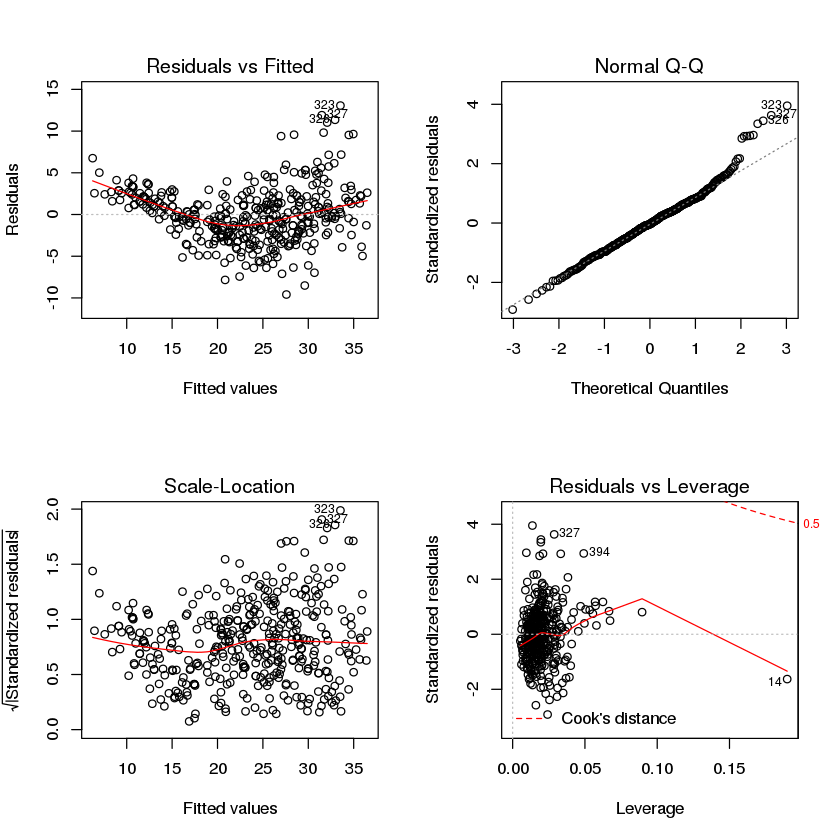

In [11]:
par(mfrow=c(2,2))
plot(lm.fit)

Again, there is evidence of non-linearity in the residual plot, as well as outliers (pts. 323, 326, 327, and 394) and high leverage points in the residuals vs. leverage plot (including pt 14, a *very* high leverage point).

In [12]:
Auto[c("14", "323", "326", "327", "394"),]

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
14,14,8,455,225,3086,10,70,1,buick estate wagon (sw)
323,46.6,4,86,65,2110,17.9,80,3,mazda glc
326,44.3,4,90,48,2085,21.7,80,2,vw rabbit c (diesel)
327,43.4,4,90,48,2335,23.7,80,2,vw dasher (diesel)
394,44,4,97,52,2130,24.6,82,2,vw pickup


### 9.e

The two largest correlation values were `(cylinders, displacement)` and `(weight, displacement)`, so I chose a model which fit to those interactions 

In [13]:
lm.fit <- lm(mpg ~ cylinders * displacement + weight * displacement, data=Auto)
summary(lm.fit)


Call:
lm(formula = mpg ~ cylinders * displacement + weight * displacement, 
    data = Auto)

Residuals:
     Min       1Q   Median       3Q      Max 
-13.2934  -2.5184  -0.3476   1.8399  17.7723 

Coefficients:
                         Estimate Std. Error t value Pr(>|t|)    
(Intercept)             5.262e+01  2.237e+00  23.519  < 2e-16 ***
cylinders               7.606e-01  7.669e-01   0.992    0.322    
displacement           -7.351e-02  1.669e-02  -4.403 1.38e-05 ***
weight                 -9.888e-03  1.329e-03  -7.438 6.69e-13 ***
cylinders:displacement -2.986e-03  3.426e-03  -0.872    0.384    
displacement:weight     2.128e-05  5.002e-06   4.254 2.64e-05 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 4.103 on 386 degrees of freedom
Multiple R-squared:  0.7272,	Adjusted R-squared:  0.7237 
F-statistic: 205.8 on 5 and 386 DF,  p-value: < 2.2e-16


This assumed linear form results in an interaction between `cylinders` and `displacement` that is negligible, but an interaction between `displacement` and `weight` which is strongly significant. In fact, `cylinders` also becomes statistically insignificant, and only `displacment` and `weight` remain.

### 9.f

Our `pairs` plot in part 9.a indicates a (power? exponential?) decay of `mpg` as a function of `displacement`, `horsepower`, and `weight`. Let's perform a fit with those values either negatively exponentiated ($\exp\left(-X\right)$) or inverted ($1/X$), and the other previously-deemed-signficant values (`year`, `origin`) included as linear terms.

In [14]:
lm.fit <- lm(mpg ~ year + origin + I(exp(-displacement)) + I(1/horsepower) + I(1/weight), data=Auto)
summary(lm.fit)


Call:
lm(formula = mpg ~ year + origin + I(exp(-displacement)) + I(1/horsepower) + 
    I(1/weight), data = Auto)

Residuals:
    Min      1Q  Median      3Q     Max 
-8.0944 -1.5880 -0.1484  1.5387 12.4025 

Coefficients:
                        Estimate Std. Error t value Pr(>|t|)    
(Intercept)           -5.469e+01  3.245e+00 -16.856  < 2e-16 ***
year                   7.503e-01  4.400e-02  17.051  < 2e-16 ***
origin                 7.156e-01  2.386e-01   3.000  0.00288 ** 
I(exp(-displacement)) -2.150e+30  9.950e+29  -2.161  0.03129 *  
I(1/horsepower)        4.362e+02  8.791e+01   4.962 1.05e-06 ***
I(1/weight)            4.222e+04  3.326e+03  12.692  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 2.951 on 386 degrees of freedom
Multiple R-squared:  0.8589,	Adjusted R-squared:  0.857 
F-statistic: 469.7 on 5 and 386 DF,  p-value: < 2.2e-16


There seems to be a fairly strong inverse relationship between `mpg` and both `horsepower` and `weight` -- that's not all that suprising, is it?

Also, fwiw, this fit has larger $R^2$ and F-statistic values than the simple linear fit.

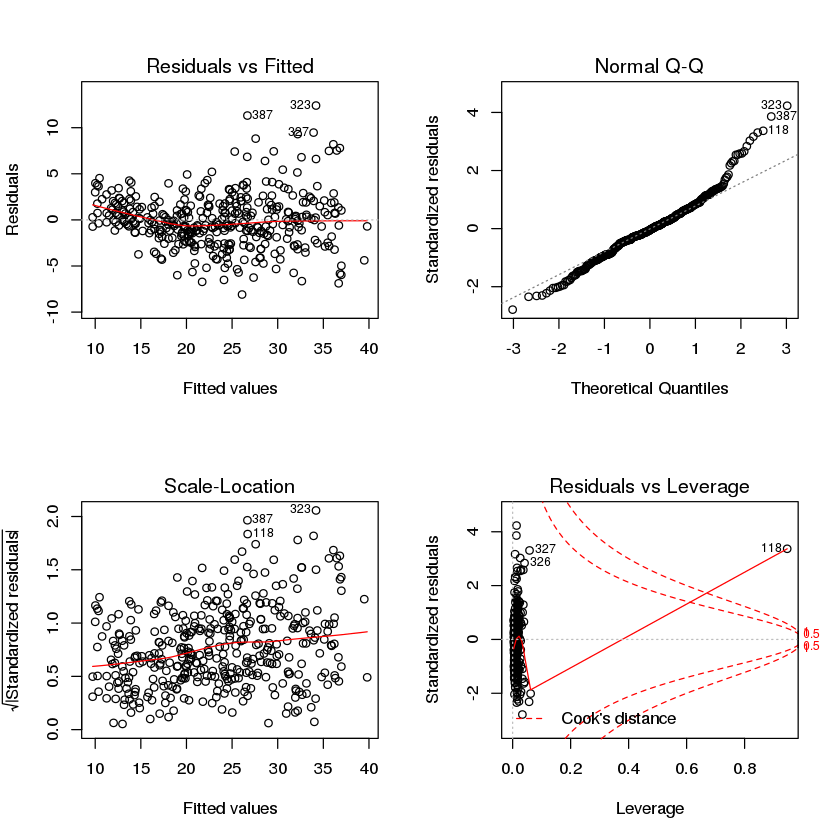

In [15]:
par(mfrow=c(2, 2))
plot(lm.fit)

## Problem 10

### 10.a

In [16]:
?Carseats

Carseats {ISLR},R Documentation


In [17]:
head(Carseats)

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
1,9.5,138,73,11,276,120,Bad,42,17,Yes,Yes
2,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
3,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
4,7.4,117,100,4,466,97,Medium,55,14,Yes,Yes
5,4.15,141,64,3,340,128,Bad,38,13,Yes,No
6,10.81,124,113,13,501,72,Bad,78,16,No,Yes


In [20]:
lm.fit <- lm(Sales ~ Price + Urban + US, data=Carseats)
summary(lm.fit)


Call:
lm(formula = Sales ~ Price + Urban + US, data = Carseats)

Residuals:
    Min      1Q  Median      3Q     Max 
-6.9206 -1.6220 -0.0564  1.5786  7.0581 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 13.043469   0.651012  20.036  < 2e-16 ***
Price       -0.054459   0.005242 -10.389  < 2e-16 ***
UrbanYes    -0.021916   0.271650  -0.081    0.936    
USYes        1.200573   0.259042   4.635 4.86e-06 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 2.472 on 396 degrees of freedom
Multiple R-squared:  0.2393,	Adjusted R-squared:  0.2335 
F-statistic: 41.52 on 3 and 396 DF,  p-value: < 2.2e-16


### 10.b

In the above fit, we see that the price has a (negative) effect on the sale of a carseat, and US stores are more likely to sell carseats than non-US scores. There is no strong statistical effect of whether or not the store is `Urban`. 

### 10.c

$
\textrm{Sales} = \beta_0 + \beta_1\times\textrm{Price} + \beta_2\times\delta_{\textrm{Urban}=\textrm{Yes}} + \beta_3\times\delta_{\textrm{US}=\textrm{Yes}}
$

### 10.d

Based solely on the details above, we can reject the null hypothesis for `Price`. We *cannot* reject the null hypothesis for `USYes`, because the calculated $\textrm{PR}\left(>|t|\right)$ depends on the choice of baseline. To reject the null hypo for that factor, we need to perform an F-statistic null hypothesis check on all variables except `USNo`. That being said, the model-wide F-stat and p-val checks pan out, so we'll go forward with these two factors.

### 10.e

In [21]:
lm.fit <- lm(Sales ~ Price + US, data=Carseats)
summary(lm.fit)


Call:
lm(formula = Sales ~ Price + US, data = Carseats)

Residuals:
    Min      1Q  Median      3Q     Max 
-6.9269 -1.6286 -0.0574  1.5766  7.0515 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 13.03079    0.63098  20.652  < 2e-16 ***
Price       -0.05448    0.00523 -10.416  < 2e-16 ***
USYes        1.19964    0.25846   4.641 4.71e-06 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 2.469 on 397 degrees of freedom
Multiple R-squared:  0.2393,	Adjusted R-squared:  0.2354 
F-statistic: 62.43 on 2 and 397 DF,  p-value: < 2.2e-16


### 10.f

Both fit the model poorly. They have comparable (bad) values for RSE and $R^2$, though the $R^2$ of the second fit is slightly better

### 10.g

In [22]:
confint(lm.fit)

,2.5 %,97.5 %
(Intercept),11.79032,14.27127
Price,-0.06475984,-0.04419543
USYes,0.6915196,1.7077663


### 10.h

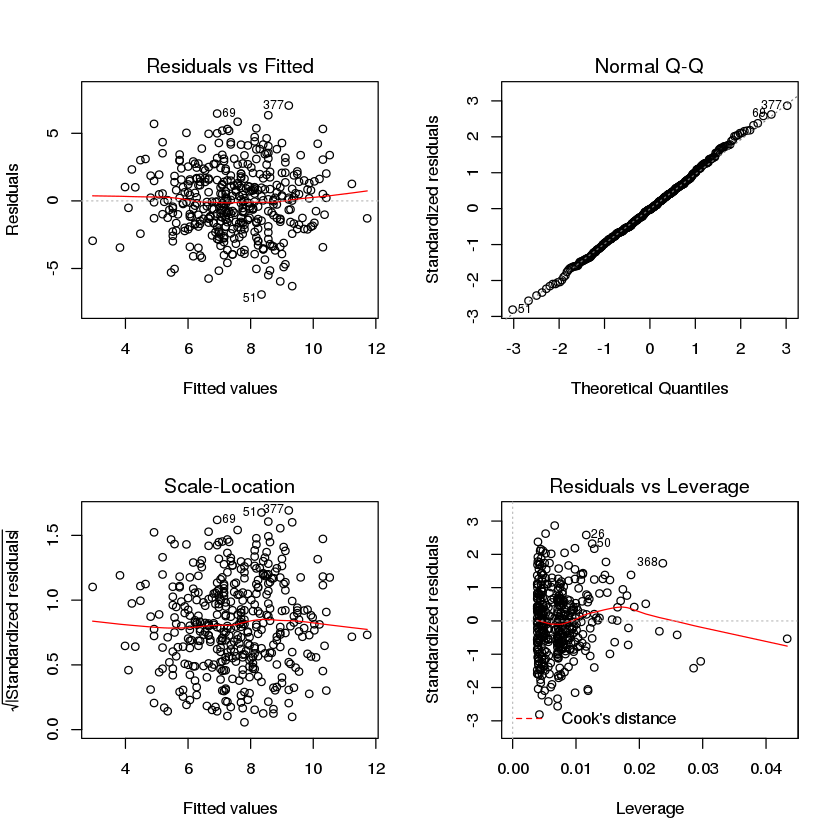

In [23]:
par(mfrow=c(2, 2))
plot(lm.fit)

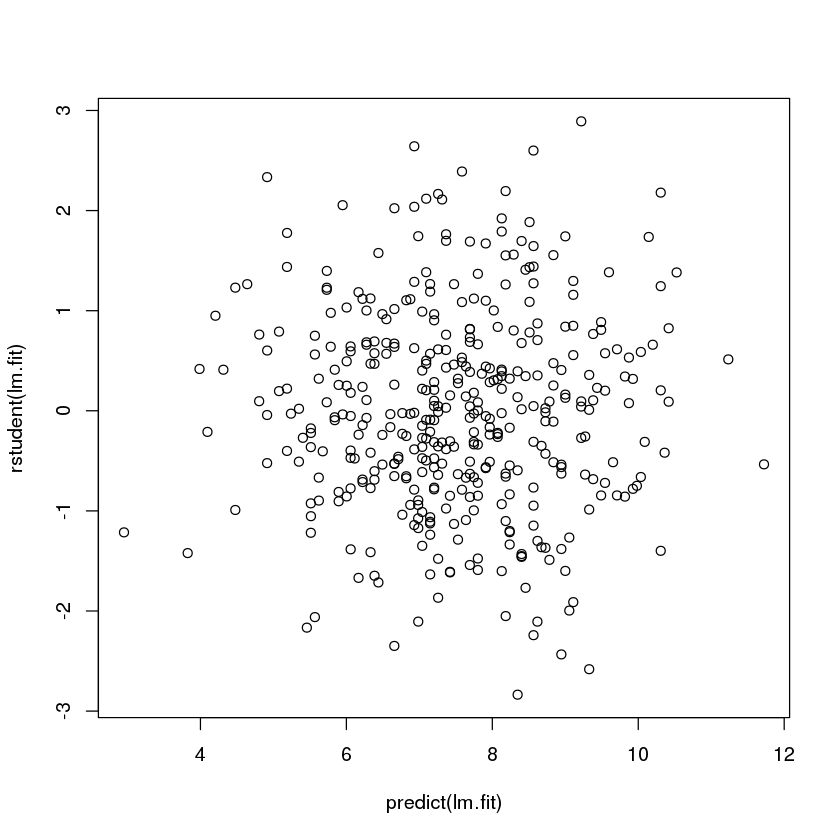

In [24]:
plot(predict(lm.fit), rstudent(lm.fit))

Not much in the way of evidence of outliers here.

## Problem 11

### 11.a

In [38]:
set.seed(1)
x <- rnorm(100)
y <- 2 * x + rnorm(100)

In [39]:
lm.fityx <- lm(y ~ 0 + x)
summary(lm.fityx)


Call:
lm(formula = y ~ 0 + x)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.9154 -0.6472 -0.1771  0.5056  2.3109 

Coefficients:
  Estimate Std. Error t value Pr(>|t|)    
x   1.9939     0.1065   18.73   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.9586 on 99 degrees of freedom
Multiple R-squared:  0.7798,	Adjusted R-squared:  0.7776 
F-statistic: 350.7 on 1 and 99 DF,  p-value: < 2.2e-16


The coefficient estimate is pretty much spot on, and the t-stat / associated p-value speak to the significance of it (that is, the null hypo can be rejected without worry).

### 11.b

In [40]:
lm.fitxy <- lm(x ~ 0 + y)
summary(lm.fitxy)


Call:
lm(formula = x ~ 0 + y)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.8699 -0.2368  0.1030  0.2858  0.8938 

Coefficients:
  Estimate Std. Error t value Pr(>|t|)    
y  0.39111    0.02089   18.73   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.4246 on 99 degrees of freedom
Multiple R-squared:  0.7798,	Adjusted R-squared:  0.7776 
F-statistic: 350.7 on 1 and 99 DF,  p-value: < 2.2e-16


All of the above statments hold again, which is unfortunate, since this answer is actually wrong...

### 11.c

Since we *know* the functional form $y = 2x + \epsilon$, we also know that $x = (y - \epsilon)/2$. The true coefficient of $y$ in the above regression *should* be 0.5, but the error term affects our ability to back out the relationship (there is no sensible transformation which can account for the "unknown" error term $\epsilon$

### 11.d

First, the proof:

$$
\beta = \dfrac{\sum x_i y_i}{\sum {x_i}^2}
$$

$$
\textrm{SE}(\beta) = \sqrt{\dfrac{\sum\left(y_i - x_i \beta\right)^2}{(n-1)\sum {x_i}^2}}
$$

$$
\begin{align}
t & = \dfrac{\beta}{\textrm{SE}(\beta)} \\
  & = \dfrac{\sum x_i y_i}{\sum {x_i}^2} \sqrt{\dfrac{(n-1)\sum {x_i}^2}{\sum\left(y_i - x_i \beta\right)^2}} \\
  & = \dfrac{\sqrt{n-1} \sum x_i y_i}{\sqrt{\sum {x_i}^2 \sum\left(y_i - x_i \beta\right)^2}} \\
  & = \dfrac{\sqrt{n-1} \sum x_i y_i}{\sqrt{\sum {x_i}^2 \sum\left({y_i}^2 - 2 x_i y_i \beta + \left(x_i \beta\right)^2\right)}} \\
  & = \dfrac{\sqrt{n-1} \sum x_i y_i}{\sqrt{\sum {x_i}^2 \sum{y_i}^2 - 2 \beta \left(\sum {x_i}^2\right) \left(\sum x_i y_i\right) + \beta^2 \left(\sum {x_i}^2\right)^2}} \\
  & = \dfrac{\sqrt{n-1} \sum x_i y_i}{\sqrt{\sum {x_i}^2 \sum{y_i}^2 - 2 \left(\sum x_i y_i\right)^2 + \left(\sum x_i y_i\right)^2}} \\
  & = \dfrac{\sqrt{n-1} \sum x_i y_i}{\sqrt{\sum {x_i}^2 \sum{y_i}^2 - \left(\sum x_i y_i\right)^2}} \\
\end{align} \\
$$

Second, the verification in `R`

In [41]:
n <- length(x)
xy <- sum(x * y)
x2 <- sum(x^2)
y2 <- sum(y^2)

(sqrt(n - 1) * xy) / sqrt(x2 * y2 - xy^2)

[1] 18.72593

In [43]:
coef(summary(lm.fitxy))

,Estimate,Std. Error,t value,Pr(>|t|)
y,3.911145e-01,2.088625e-02,1.872593e+01,2.642197e-34


They appear identical

### 11.e

the formula for the t-statistic above is symmetric under exchange of $x$ and $y$.

### 11.f

In [44]:
lm.fitxy <- lm(x ~ y)
lm.fityx <- lm(y ~ x)

In [45]:
coef(summary(lm.fitxy))

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.03880394,0.04266144,0.90957869,0.36527637
y,3.894245e-01,2.098690e-02,1.855560e+01,7.723851e-34


In [46]:
coef(summary(lm.fityx))

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),-0.03769261,0.09698729,-0.38863455,0.69838955
x,1.998940e+00,1.077270e-01,1.855560e+01,7.723851e-34


As predicted by the question, they match

## Problem 12

### 12.a

Given
$$
\beta_{Y|X} = \dfrac{\sum x_i y_i}{\sum {x_i}^2}
$$

we will have
$$
\begin{align}
\beta_{Y|X} = \beta_{X|Y} & \iff \dfrac{\sum x_i y_i}{\sum {x_i}^2} = \dfrac{\sum x_i y_i}{\sum {y_i}^2} \\
                          & \iff \sum {x_i}^2 = \sum {y_i}^2
\end{align}
$$

### 12.b

In [57]:
set.seed(1)
x <- rnorm(100)
y <- 2 * x + rnorm(100)
lm.neq.yx <- lm(y ~ x)
lm.neq.xy <- lm(x ~ y)
coef(summary(lm.neq.yx))

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),-0.03769261,0.09698729,-0.38863455,0.69838955
x,1.998940e+00,1.077270e-01,1.855560e+01,7.723851e-34


In [58]:
coef(summary(lm.neq.xy))

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.03880394,0.04266144,0.90957869,0.36527637
y,3.894245e-01,2.098690e-02,1.855560e+01,7.723851e-34


The above coefficients are not equal

### 12.c

In [60]:
y <- rev(x)
lm.eq.yx <- lm(y ~ x)
lm.eq.xy <- lm(x ~ y)
coef(summary(lm.eq.yx))

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.10632109,0.09091938,1.16939965,0.24507904
x,0.02356817,0.10098720,0.23337777,0.81595486


In [61]:
coef(summary(lm.eq.xy))

,Estimate,Std. Error,t value,Pr(>|t|)
(Intercept),0.10632109,0.09091938,1.16939965,0.24507904
y,0.02356817,0.10098720,0.23337777,0.81595486


The above coefficients are equal

## Problem 13

In [81]:
set.seed(1)

### 13.a

In [82]:
x <- rnorm(100)

### 13.b

In [83]:
eps <- rnorm(100, 0, sqrt(0.25))

### 13.c

In [84]:
y <- -1 + 0.5 * x + eps
length(y)

[1] 100

$\beta_0=-1$ and $\beta_1=0.5$

### 13.d

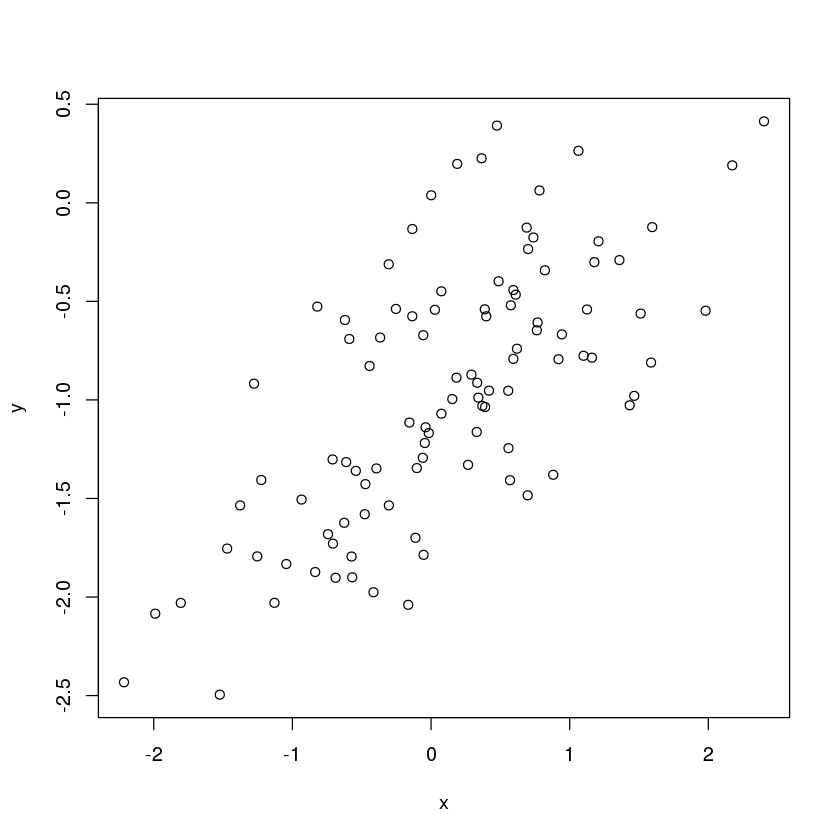

In [85]:
plot(x, y)

There is a clear linear relationship, but significant enough noise that I expect fits to this data to be somewhat errant

### 13.e

In [86]:
lm.fit <- lm(y ~ x)
summary(lm.fit)


Call:
lm(formula = y ~ x)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.93842 -0.30688 -0.06975  0.26970  1.17309 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -1.01885    0.04849 -21.010  < 2e-16 ***
x            0.49947    0.05386   9.273 4.58e-15 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.4814 on 98 degrees of freedom
Multiple R-squared:  0.4674,	Adjusted R-squared:  0.4619 
F-statistic: 85.99 on 1 and 98 DF,  p-value: 4.583e-15


In [87]:
confint(lm.fit)

,2.5 %,97.5 %
(Intercept),-1.1150804,-0.9226122
x,0.3925794,0.6063602


All together, not bad. The estimated coefficientvalues are pretty close to the true values (well within std. error estimates).

### 13.f

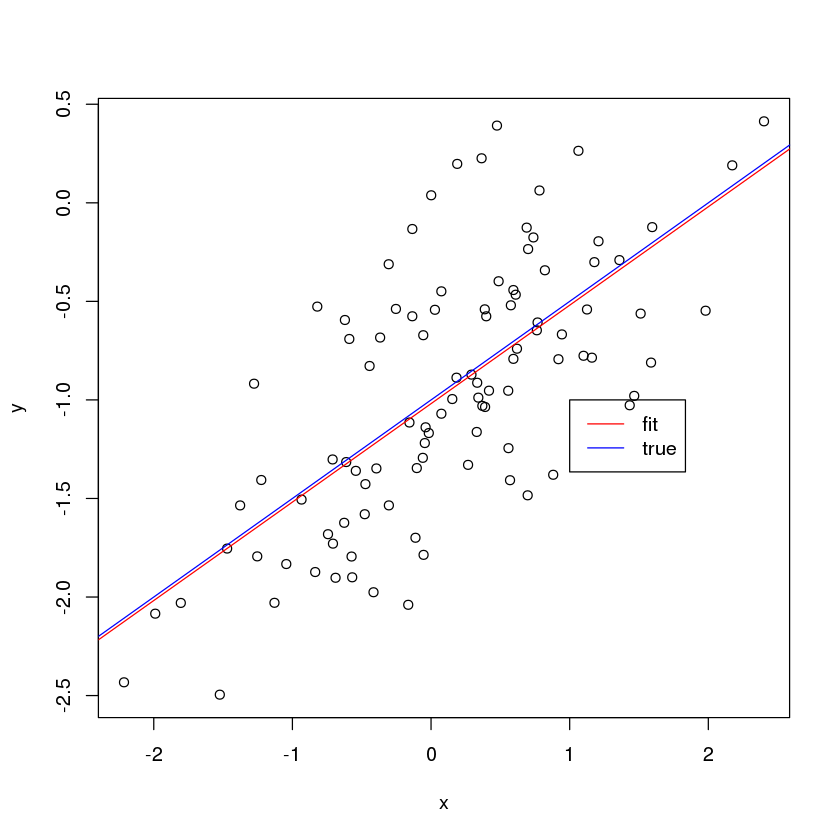

In [88]:
plot(x, y)
abline(lm.fit, col="red")
abline(-1, 0.5, col="blue")
legend(-1, legend=c("fit", "true"), col=c("red", "blue"), lwd=1)

### 13.g

In [90]:
lm.poly <- lm(y ~ x + I(x^2))
summary(lm.poly)


Call:
lm(formula = y ~ x + I(x^2))

Residuals:
     Min       1Q   Median       3Q      Max 
-0.98252 -0.31270 -0.06441  0.29014  1.13500 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.97164    0.05883 -16.517  < 2e-16 ***
x            0.50858    0.05399   9.420  2.4e-15 ***
I(x^2)      -0.05946    0.04238  -1.403    0.164    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.479 on 97 degrees of freedom
Multiple R-squared:  0.4779,	Adjusted R-squared:  0.4672 
F-statistic:  44.4 on 2 and 97 DF,  p-value: 2.038e-14


The polynomial term is deemed statistically insignificant by the null hypothesis (large $\textrm{Pr}(>|t|)$)

### 13.h

In [98]:
eps2 <- rnorm(100, 0, sqrt(0.05))
y2 <- -1 + 0.5 * x + eps2
lm.fit2 <- lm(y2 ~ x)
summary(lm.fit2)


Call:
lm(formula = y2 ~ x)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.52402 -0.13509  0.00189  0.16172  0.45987 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -1.00708    0.02174  -46.32   <2e-16 ***
x            0.47355    0.02415   19.61   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.2158 on 98 degrees of freedom
Multiple R-squared:  0.7969,	Adjusted R-squared:  0.7948 
F-statistic: 384.5 on 1 and 98 DF,  p-value: < 2.2e-16


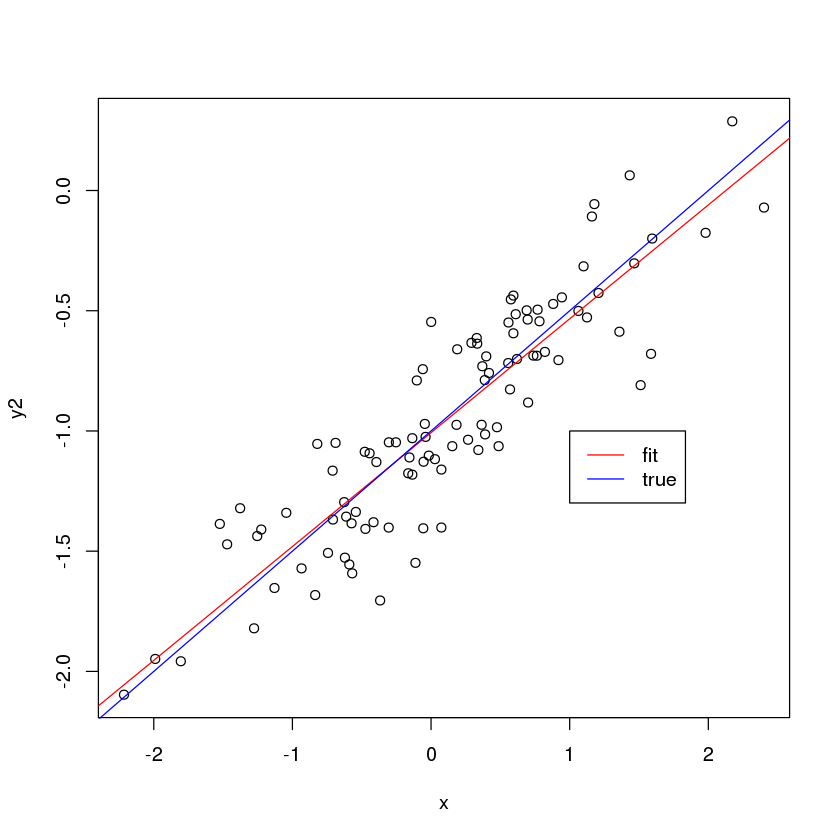

In [99]:
plot(x, y2)
abline(lm.fit2, col="red")
abline(-1, 0.5, col="blue")
legend(-1, legend=c("fit", "true"), col=c("red", "blue"), lw=1)

Less SE $\Rightarrow$ smaller RSE, and a higher $R^2$.

### 13.i

In [100]:
eps3 <- rnorm(100, 0, sqrt(0.5))
y3 <- -1 + 0.5 * x + eps3
lm.fit3 <- lm(y3 ~ x)
summary(lm.fit3)


Call:
lm(formula = y3 ~ x)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.07501 -0.57196 -0.05345  0.54210  1.95856 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -1.14912    0.07710 -14.905  < 2e-16 ***
x            0.57342    0.08563   6.696 1.35e-09 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.7653 on 98 degrees of freedom
Multiple R-squared:  0.3139,	Adjusted R-squared:  0.3069 
F-statistic: 44.84 on 1 and 98 DF,  p-value: 1.35e-09


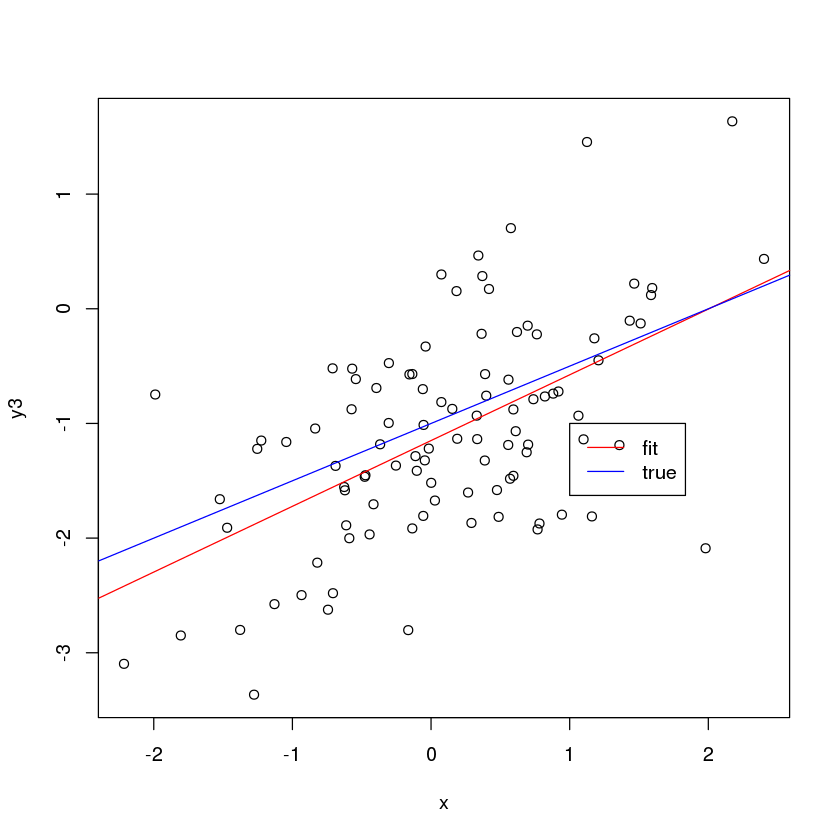

In [101]:
plot(x, y3)
abline(lm.fit3, col="red")
abline(-1, 0.5, col="blue")
legend(-1, legend=c("fit", "true"), col=c("red", "blue"), lw=1)

### 13.j

In [102]:
confint(lm.fit)

,2.5 %,97.5 %
(Intercept),-1.1150804,-0.9226122
x,0.3925794,0.6063602


In [103]:
confint(lm.fit2)

,2.5 %,97.5 %
(Intercept),-1.0502222,-0.9639282
x,0.4256295,0.5214792


In [104]:
confint(lm.fit3)

,2.5 %,97.5 %
(Intercept),-1.3021109,-0.9961257
x,0.4034825,0.7433505


The second fit (least noisy) has the narrowest confidence interval, and the third fit (most noisy) has the widest -- as expected

## Problem 14

### 14.a

In [105]:
set.seed(1)
x1 <- runif(100)
x2 <- 0.5 * x1 + rnorm(100) / 10
eps <- rnorm(100)
y <- 2 + 2 * x1 + 0.3 * x2 + eps

$y = \beta_0 + \beta_1 \times x_1 + \beta_2 \times x_2 + \epsilon$.

$\beta_0 = 2$, $\beta_1 = 2$, $\beta_2 = 0.3$


### 14.b

$x_2 = 0.5 \times x_1 + \epsilon$

In [108]:
cor(x1, x2)

[1] 0.8351212

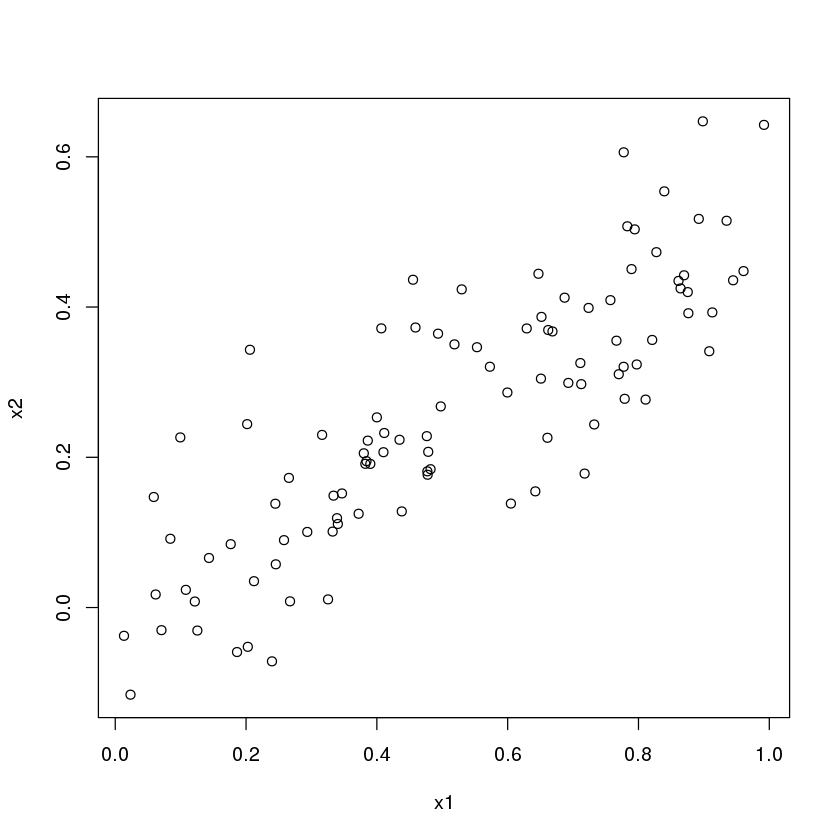

In [109]:
plot(x1, x2)

### 14.c

In [111]:
lm.fit <- lm(y ~ x1 + x2)
summary(lm.fit)


Call:
lm(formula = y ~ x1 + x2)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.8311 -0.7273 -0.0537  0.6338  2.3359 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.1305     0.2319   9.188 7.61e-15 ***
x1            1.4396     0.7212   1.996   0.0487 *  
x2            1.0097     1.1337   0.891   0.3754    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 1.056 on 97 degrees of freedom
Multiple R-squared:  0.2088,	Adjusted R-squared:  0.1925 
F-statistic:  12.8 on 2 and 97 DF,  p-value: 1.164e-05


The coefficients returned are not very close to the known values. Although we could technically accept the coefficient of `x1` as significant, I would not feel confident in it at only 1 std.

I would reject the overall null hypothesis for the model p-value of 1.164e-05, however

### 14.d

In [113]:
lm.x1.fit <- lm(y ~ x1)
summary(lm.x1.fit)


Call:
lm(formula = y ~ x1)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.89495 -0.66874 -0.07785  0.59221  2.45560 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.1124     0.2307   9.155 8.27e-15 ***
x1            1.9759     0.3963   4.986 2.66e-06 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 1.055 on 98 degrees of freedom
Multiple R-squared:  0.2024,	Adjusted R-squared:  0.1942 
F-statistic: 24.86 on 1 and 98 DF,  p-value: 2.661e-06


I will note that $x_2 = 0.5 x_1 + \epsilon$, so we can re-interpret this coefficient slightly:
$$
\begin{align}
y & = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \epsilon \\
  & = \beta_0 + (\beta_1 + 0.5 \beta_2) x_1 + \epsilon \\
  & = 2 + 2.6 x_1 + \epsilon
\end{align}
$$

So while this analysis results in statistically significant coefficients that are close to the original values (2, 2), there are still some problems with this model and fit.

### 14.e

In [116]:
lm.x2.fit <- lm(y ~ x2)
summary(lm.x2.fit)


Call:
lm(formula = y ~ x2)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.62687 -0.75156 -0.03598  0.72383  2.44890 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.3899     0.1949   12.26  < 2e-16 ***
x2            2.8996     0.6330    4.58 1.37e-05 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 1.072 on 98 degrees of freedom
Multiple R-squared:  0.1763,	Adjusted R-squared:  0.1679 
F-statistic: 20.98 on 1 and 98 DF,  p-value: 1.366e-05


**wuhoh**! The `x2` term is having the effects of the `x1` term blended into it (hence the statistically significant but very different) coefficient.

As above, because $x_1 = (x_2 - \epsilon) / 0.5$
$$
\begin{align}
y & = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \epsilon \\
  & = \beta_0 + (2 \beta_1 + \beta_2) x_2 + \epsilon \\
  & = 2 + 4.3 x_1 + \epsilon
\end{align}
$$

So our coefficient not being 0.3 might be okay, but it is still very much wrong (in spite of passing the null value hypothesis).

### 14.f

These results *do not* contradict each other -- they're all plenty wrong!

### 14.g

In [125]:
x1 <- c(x1, 0.1)
x2 <- c(x2, 0.8)
y <- c(y, 6)

In [126]:
lm.bad.fit <- lm(y ~ x1 + x2)
summary(lm.bad.fit)


Call:
lm(formula = y ~ x1 + x2)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.69309 -0.68184 -0.04583  0.75224  2.29389 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.2665     0.2303   9.840 2.45e-16 ***
x1            0.1671     0.5246   0.318    0.751    
x2            3.1371     0.7703   4.073 9.37e-05 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 1.079 on 99 degrees of freedom
Multiple R-squared:  0.246,	Adjusted R-squared:  0.2308 
F-statistic: 16.15 on 2 and 99 DF,  p-value: 8.501e-07


In [127]:
lm.bad.x1.fit <- lm(y ~ x1)
summary(lm.bad.x1.fit)


Call:
lm(formula = y ~ x1)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.8848 -0.6542 -0.0769  0.6137  3.4510 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.3921     0.2454   9.747 3.55e-16 ***
x1            1.5691     0.4255   3.687 0.000369 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 1.16 on 100 degrees of freedom
Multiple R-squared:  0.1197,	Adjusted R-squared:  0.1109 
F-statistic:  13.6 on 1 and 100 DF,  p-value: 0.0003686


In [128]:
lm.bad.x2.fit <- lm(y ~ x2)
summary(lm.bad.x2.fit)


Call:
lm(formula = y ~ x2)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.66396 -0.67794 -0.06181  0.75541  2.32512 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   2.3085     0.1879   12.28  < 2e-16 ***
x2            3.2981     0.5786    5.70 1.21e-07 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 1.074 on 100 degrees of freedom
Multiple R-squared:  0.2452,	Adjusted R-squared:  0.2377 
F-statistic: 32.49 on 1 and 100 DF,  p-value: 1.214e-07


Similar behavior, but worse outcome.

## Problem 15

In [220]:
library(MASS)
Boston$chas <- factor(Boston$chas, labels = c("N","Y"))
attach(Boston)

The following objects are masked from Boston (pos = 3):

    age, black, chas, crim, dis, indus, lstat, medv, nox, ptratio, rad,
    rm, tax, zn

The following objects are masked from Boston (pos = 4):

    age, black, chas, crim, dis, indus, lstat, medv, nox, ptratio, rad,
    rm, tax, zn



### 15.a

Every factor? shit man...

In [201]:
names(Boston)

[1] "crim"    "zn"      "indus"   "chas"    "nox"     "rm"      "age"    
 [8] "dis"     "rad"     "tax"     "ptratio" "black"   "lstat"   "medv"

In [202]:
lm.zn <- lm(crim ~ zn, data=Boston)
lm.indus <- lm(crim ~ indus, data=Boston)
lm.chas <- lm(crim ~ chas, data=Boston)
lm.nox <- lm(crim ~ nox, data=Boston)
lm.rm <- lm(crim ~ rm, data=Boston)
lm.age <- lm(crim ~ age, data=Boston)
lm.dis <- lm(crim ~ dis, data=Boston)
lm.rad <- lm(crim ~ rad, data=Boston)
lm.tax <- lm(crim ~ tax, data=Boston)
lm.ptratio <- lm(crim ~ ptratio, data=Boston)
lm.black <- lm(crim ~ black, data=Boston)
lm.lstat <- lm(crim ~ lstat, data=Boston)
lm.medv <- lm(crim ~ medv, data=Boston)

In [203]:
summary(lm.zn)


Call:
lm(formula = crim ~ zn, data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-4.429 -4.222 -2.620  1.250 84.523 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  4.45369    0.41722  10.675  < 2e-16 ***
zn          -0.07393    0.01609  -4.594 5.51e-06 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 8.435 on 504 degrees of freedom
Multiple R-squared:  0.04019,	Adjusted R-squared:  0.03828 
F-statistic:  21.1 on 1 and 504 DF,  p-value: 5.506e-06


In [204]:
summary(lm.indus)


Call:
lm(formula = crim ~ indus, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-11.972  -2.698  -0.736   0.712  81.813 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -2.06374    0.66723  -3.093  0.00209 ** 
indus        0.50978    0.05102   9.991  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.866 on 504 degrees of freedom
Multiple R-squared:  0.1653,	Adjusted R-squared:  0.1637 
F-statistic: 99.82 on 1 and 504 DF,  p-value: < 2.2e-16


In [205]:
summary(lm.chas)


Call:
lm(formula = crim ~ chas, data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-3.738 -3.661 -3.435  0.018 85.232 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   3.7444     0.3961   9.453   <2e-16 ***
chasY        -1.8928     1.5061  -1.257    0.209    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 8.597 on 504 degrees of freedom
Multiple R-squared:  0.003124,	Adjusted R-squared:  0.001146 
F-statistic: 1.579 on 1 and 504 DF,  p-value: 0.2094


In [206]:
summary(lm.nox)


Call:
lm(formula = crim ~ nox, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-12.371  -2.738  -0.974   0.559  81.728 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -13.720      1.699  -8.073 5.08e-15 ***
nox           31.249      2.999  10.419  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.81 on 504 degrees of freedom
Multiple R-squared:  0.1772,	Adjusted R-squared:  0.1756 
F-statistic: 108.6 on 1 and 504 DF,  p-value: < 2.2e-16


In [207]:
summary(lm.rm)


Call:
lm(formula = crim ~ rm, data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-6.604 -3.952 -2.654  0.989 87.197 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   20.482      3.365   6.088 2.27e-09 ***
rm            -2.684      0.532  -5.045 6.35e-07 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 8.401 on 504 degrees of freedom
Multiple R-squared:  0.04807,	Adjusted R-squared:  0.04618 
F-statistic: 25.45 on 1 and 504 DF,  p-value: 6.347e-07


In [208]:
summary(lm.age)


Call:
lm(formula = crim ~ age, data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-6.789 -4.257 -1.230  1.527 82.849 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -3.77791    0.94398  -4.002 7.22e-05 ***
age          0.10779    0.01274   8.463 2.85e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 8.057 on 504 degrees of freedom
Multiple R-squared:  0.1244,	Adjusted R-squared:  0.1227 
F-statistic: 71.62 on 1 and 504 DF,  p-value: 2.855e-16


In [209]:
summary(lm.dis)


Call:
lm(formula = crim ~ dis, data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-6.708 -4.134 -1.527  1.516 81.674 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   9.4993     0.7304  13.006   <2e-16 ***
dis          -1.5509     0.1683  -9.213   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.965 on 504 degrees of freedom
Multiple R-squared:  0.1441,	Adjusted R-squared:  0.1425 
F-statistic: 84.89 on 1 and 504 DF,  p-value: < 2.2e-16


In [210]:
summary(lm.rad)


Call:
lm(formula = crim ~ rad, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-10.164  -1.381  -0.141   0.660  76.433 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -2.28716    0.44348  -5.157 3.61e-07 ***
rad          0.61791    0.03433  17.998  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 6.718 on 504 degrees of freedom
Multiple R-squared:  0.3913,	Adjusted R-squared:   0.39 
F-statistic: 323.9 on 1 and 504 DF,  p-value: < 2.2e-16


In [211]:
summary(lm.tax)


Call:
lm(formula = crim ~ tax, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-12.513  -2.738  -0.194   1.065  77.696 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -8.528369   0.815809  -10.45   <2e-16 ***
tax          0.029742   0.001847   16.10   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 6.997 on 504 degrees of freedom
Multiple R-squared:  0.3396,	Adjusted R-squared:  0.3383 
F-statistic: 259.2 on 1 and 504 DF,  p-value: < 2.2e-16


In [212]:
summary(lm.ptratio)


Call:
lm(formula = crim ~ ptratio, data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-7.654 -3.985 -1.912  1.825 83.353 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -17.6469     3.1473  -5.607 3.40e-08 ***
ptratio       1.1520     0.1694   6.801 2.94e-11 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 8.24 on 504 degrees of freedom
Multiple R-squared:  0.08407,	Adjusted R-squared:  0.08225 
F-statistic: 46.26 on 1 and 504 DF,  p-value: 2.943e-11


In [213]:
summary(lm.black)


Call:
lm(formula = crim ~ black, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-13.756  -2.299  -2.095  -1.296  86.822 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 16.553529   1.425903  11.609   <2e-16 ***
black       -0.036280   0.003873  -9.367   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.946 on 504 degrees of freedom
Multiple R-squared:  0.1483,	Adjusted R-squared:  0.1466 
F-statistic: 87.74 on 1 and 504 DF,  p-value: < 2.2e-16


In [214]:
summary(lm.lstat)


Call:
lm(formula = crim ~ lstat, data = Boston)

Residuals:
    Min      1Q  Median      3Q     Max 
-13.925  -2.822  -0.664   1.079  82.862 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) -3.33054    0.69376  -4.801 2.09e-06 ***
lstat        0.54880    0.04776  11.491  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.664 on 504 degrees of freedom
Multiple R-squared:  0.2076,	Adjusted R-squared:  0.206 
F-statistic:   132 on 1 and 504 DF,  p-value: < 2.2e-16


In [215]:
summary(lm.medv)


Call:
lm(formula = crim ~ medv, data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-9.071 -4.022 -2.343  1.298 80.957 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept) 11.79654    0.93419   12.63   <2e-16 ***
medv        -0.36316    0.03839   -9.46   <2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.934 on 504 degrees of freedom
Multiple R-squared:  0.1508,	Adjusted R-squared:  0.1491 
F-statistic: 89.49 on 1 and 504 DF,  p-value: < 2.2e-16


Individually, every variable is statistically significant except for `chas`

### 15.b

In [221]:
lm.fit <- lm(crim ~ ., data=Boston)
summary(lm.fit)


Call:
lm(formula = crim ~ ., data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-9.924 -2.120 -0.353  1.019 75.051 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  17.033228   7.234903   2.354 0.018949 *  
zn            0.044855   0.018734   2.394 0.017025 *  
indus        -0.063855   0.083407  -0.766 0.444294    
chasY        -0.749134   1.180147  -0.635 0.525867    
nox         -10.313535   5.275536  -1.955 0.051152 .  
rm            0.430131   0.612830   0.702 0.483089    
age           0.001452   0.017925   0.081 0.935488    
dis          -0.987176   0.281817  -3.503 0.000502 ***
rad           0.588209   0.088049   6.680 6.46e-11 ***
tax          -0.003780   0.005156  -0.733 0.463793    
ptratio      -0.271081   0.186450  -1.454 0.146611    
black        -0.007538   0.003673  -2.052 0.040702 *  
lstat         0.126211   0.075725   1.667 0.096208 .  
medv         -0.198887   0.060516  -3.287 0.001087 ** 
---
Signif. codes:  0 '***' 0.0

With *all* factors accounted for, the number of statistically significant factors drops dramatically. Now only `dis` and `rad` are strongly significant, with `zn`, `black`, and `medv` also passing their p-val null hypo tests.

### 15.c

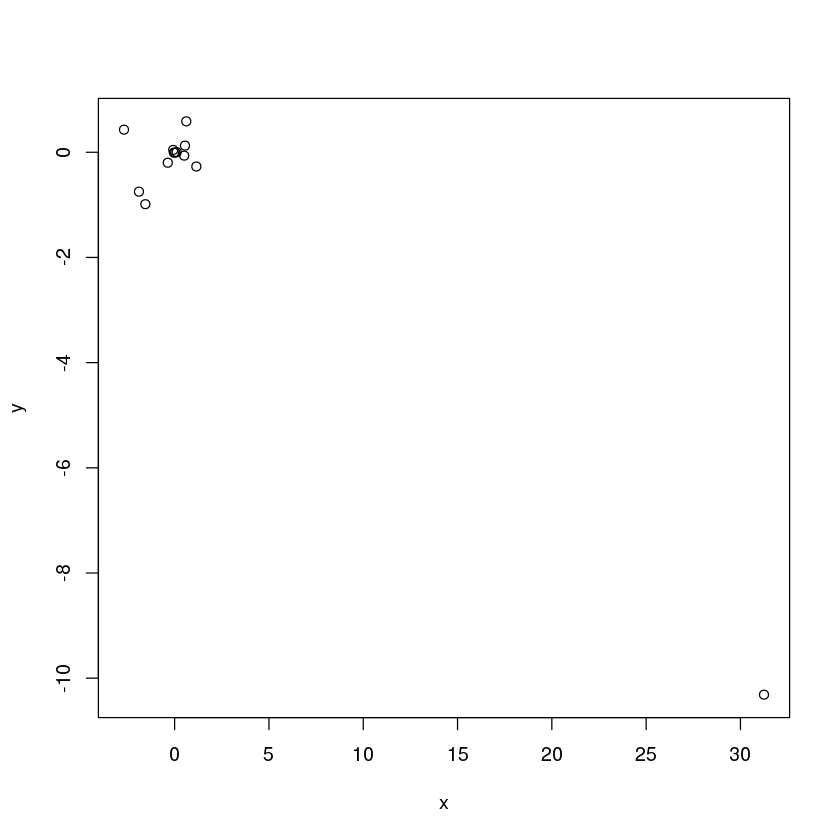

In [248]:
x <- c(
    coef(lm.zn)[2],
    coef(lm.indus)[2],
    coef(lm.chas)[2],
    coef(lm.nox)[2],
    coef(lm.rm)[2],
    coef(lm.age)[2],
    coef(lm.dis)[2],
    coef(lm.rad)[2],
    coef(lm.tax)[2],
    coef(lm.ptratio)[2],
    coef(lm.black)[2],
    coef(lm.lstat)[2],
    coef(lm.medv)[2]
)
y <- coef(lm.fit)[2:14]
plot(x, y)

In [250]:
lm.zn <- lm(crim ~ poly(zn, 3))
lm.indus <- lm(crim ~ poly(indus, 3))
lm.nox <- lm(crim ~ poly(nox, 3))
lm.rm <- lm(crim ~ poly(rm, 3))
lm.age <- lm(crim ~ poly(age, 3))
lm.dis <- lm(crim ~ poly(dis, 3))
lm.rad <- lm(crim ~ poly(rad, 3))
lm.tax <- lm(crim ~ poly(tax, 3))
lm.ptratio <- lm(crim ~ poly(ptratio, 3))
lm.black <- lm(crim ~ poly(black, 3))
lm.lstat <- lm(crim ~ poly(lstat, 3))
lm.medv <- lm(crim ~ poly(medv, 3))

In [251]:
summary(lm.zn)


Call:
lm(formula = crim ~ poly(zn, 3))

Residuals:
   Min     1Q Median     3Q    Max 
-4.821 -4.614 -1.294  0.473 84.130 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)    3.6135     0.3722   9.709  < 2e-16 ***
poly(zn, 3)1 -38.7498     8.3722  -4.628  4.7e-06 ***
poly(zn, 3)2  23.9398     8.3722   2.859  0.00442 ** 
poly(zn, 3)3 -10.0719     8.3722  -1.203  0.22954    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 8.372 on 502 degrees of freedom
Multiple R-squared:  0.05824,	Adjusted R-squared:  0.05261 
F-statistic: 10.35 on 3 and 502 DF,  p-value: 1.281e-06


In [252]:
summary(lm.indus)


Call:
lm(formula = crim ~ poly(indus, 3))

Residuals:
   Min     1Q Median     3Q    Max 
-8.278 -2.514  0.054  0.764 79.713 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)        3.614      0.330  10.950  < 2e-16 ***
poly(indus, 3)1   78.591      7.423  10.587  < 2e-16 ***
poly(indus, 3)2  -24.395      7.423  -3.286  0.00109 ** 
poly(indus, 3)3  -54.130      7.423  -7.292  1.2e-12 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.423 on 502 degrees of freedom
Multiple R-squared:  0.2597,	Adjusted R-squared:  0.2552 
F-statistic: 58.69 on 3 and 502 DF,  p-value: < 2.2e-16


In [253]:
summary(lm.chas)


Call:
lm(formula = crim ~ chas, data = Boston)

Residuals:
   Min     1Q Median     3Q    Max 
-3.738 -3.661 -3.435  0.018 85.232 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)   3.7444     0.3961   9.453   <2e-16 ***
chasY        -1.8928     1.5061  -1.257    0.209    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 8.597 on 504 degrees of freedom
Multiple R-squared:  0.003124,	Adjusted R-squared:  0.001146 
F-statistic: 1.579 on 1 and 504 DF,  p-value: 0.2094


In [254]:
summary(lm.nox)


Call:
lm(formula = crim ~ poly(nox, 3))

Residuals:
   Min     1Q Median     3Q    Max 
-9.110 -2.068 -0.255  0.739 78.302 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)     3.6135     0.3216  11.237  < 2e-16 ***
poly(nox, 3)1  81.3720     7.2336  11.249  < 2e-16 ***
poly(nox, 3)2 -28.8286     7.2336  -3.985 7.74e-05 ***
poly(nox, 3)3 -60.3619     7.2336  -8.345 6.96e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.234 on 502 degrees of freedom
Multiple R-squared:  0.297,	Adjusted R-squared:  0.2928 
F-statistic: 70.69 on 3 and 502 DF,  p-value: < 2.2e-16


In [255]:
summary(lm.rm)


Call:
lm(formula = crim ~ poly(rm, 3))

Residuals:
    Min      1Q  Median      3Q     Max 
-18.485  -3.468  -2.221  -0.015  87.219 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)    3.6135     0.3703   9.758  < 2e-16 ***
poly(rm, 3)1 -42.3794     8.3297  -5.088 5.13e-07 ***
poly(rm, 3)2  26.5768     8.3297   3.191  0.00151 ** 
poly(rm, 3)3  -5.5103     8.3297  -0.662  0.50858    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 8.33 on 502 degrees of freedom
Multiple R-squared:  0.06779,	Adjusted R-squared:  0.06222 
F-statistic: 12.17 on 3 and 502 DF,  p-value: 1.067e-07


In [256]:
summary(lm.age)


Call:
lm(formula = crim ~ poly(age, 3))

Residuals:
   Min     1Q Median     3Q    Max 
-9.762 -2.673 -0.516  0.019 82.842 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)     3.6135     0.3485  10.368  < 2e-16 ***
poly(age, 3)1  68.1820     7.8397   8.697  < 2e-16 ***
poly(age, 3)2  37.4845     7.8397   4.781 2.29e-06 ***
poly(age, 3)3  21.3532     7.8397   2.724  0.00668 ** 
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.84 on 502 degrees of freedom
Multiple R-squared:  0.1742,	Adjusted R-squared:  0.1693 
F-statistic: 35.31 on 3 and 502 DF,  p-value: < 2.2e-16


In [257]:
summary(lm.dis)


Call:
lm(formula = crim ~ poly(dis, 3))

Residuals:
    Min      1Q  Median      3Q     Max 
-10.757  -2.588   0.031   1.267  76.378 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)     3.6135     0.3259  11.087  < 2e-16 ***
poly(dis, 3)1 -73.3886     7.3315 -10.010  < 2e-16 ***
poly(dis, 3)2  56.3730     7.3315   7.689 7.87e-14 ***
poly(dis, 3)3 -42.6219     7.3315  -5.814 1.09e-08 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.331 on 502 degrees of freedom
Multiple R-squared:  0.2778,	Adjusted R-squared:  0.2735 
F-statistic: 64.37 on 3 and 502 DF,  p-value: < 2.2e-16


In [258]:
summary(lm.rad)


Call:
lm(formula = crim ~ poly(rad, 3))

Residuals:
    Min      1Q  Median      3Q     Max 
-10.381  -0.412  -0.269   0.179  76.217 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)     3.6135     0.2971  12.164  < 2e-16 ***
poly(rad, 3)1 120.9074     6.6824  18.093  < 2e-16 ***
poly(rad, 3)2  17.4923     6.6824   2.618  0.00912 ** 
poly(rad, 3)3   4.6985     6.6824   0.703  0.48231    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 6.682 on 502 degrees of freedom
Multiple R-squared:    0.4,	Adjusted R-squared:  0.3965 
F-statistic: 111.6 on 3 and 502 DF,  p-value: < 2.2e-16


In [259]:
summary(lm.tax)


Call:
lm(formula = crim ~ poly(tax, 3))

Residuals:
    Min      1Q  Median      3Q     Max 
-13.273  -1.389   0.046   0.536  76.950 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)     3.6135     0.3047  11.860  < 2e-16 ***
poly(tax, 3)1 112.6458     6.8537  16.436  < 2e-16 ***
poly(tax, 3)2  32.0873     6.8537   4.682 3.67e-06 ***
poly(tax, 3)3  -7.9968     6.8537  -1.167    0.244    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 6.854 on 502 degrees of freedom
Multiple R-squared:  0.3689,	Adjusted R-squared:  0.3651 
F-statistic:  97.8 on 3 and 502 DF,  p-value: < 2.2e-16


In [260]:
summary(lm.ptratio)


Call:
lm(formula = crim ~ poly(ptratio, 3))

Residuals:
   Min     1Q Median     3Q    Max 
-6.833 -4.146 -1.655  1.408 82.697 

Coefficients:
                  Estimate Std. Error t value Pr(>|t|)    
(Intercept)          3.614      0.361  10.008  < 2e-16 ***
poly(ptratio, 3)1   56.045      8.122   6.901 1.57e-11 ***
poly(ptratio, 3)2   24.775      8.122   3.050  0.00241 ** 
poly(ptratio, 3)3  -22.280      8.122  -2.743  0.00630 ** 
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 8.122 on 502 degrees of freedom
Multiple R-squared:  0.1138,	Adjusted R-squared:  0.1085 
F-statistic: 21.48 on 3 and 502 DF,  p-value: 4.171e-13


In [261]:
summary(lm.black)


Call:
lm(formula = crim ~ poly(black, 3))

Residuals:
    Min      1Q  Median      3Q     Max 
-13.096  -2.343  -2.128  -1.439  86.790 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)       3.6135     0.3536  10.218   <2e-16 ***
poly(black, 3)1 -74.4312     7.9546  -9.357   <2e-16 ***
poly(black, 3)2   5.9264     7.9546   0.745    0.457    
poly(black, 3)3  -4.8346     7.9546  -0.608    0.544    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.955 on 502 degrees of freedom
Multiple R-squared:  0.1498,	Adjusted R-squared:  0.1448 
F-statistic: 29.49 on 3 and 502 DF,  p-value: < 2.2e-16


In [262]:
summary(lm.lstat)


Call:
lm(formula = crim ~ poly(lstat, 3))

Residuals:
    Min      1Q  Median      3Q     Max 
-15.234  -2.151  -0.486   0.066  83.353 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)       3.6135     0.3392  10.654   <2e-16 ***
poly(lstat, 3)1  88.0697     7.6294  11.543   <2e-16 ***
poly(lstat, 3)2  15.8882     7.6294   2.082   0.0378 *  
poly(lstat, 3)3 -11.5740     7.6294  -1.517   0.1299    
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 7.629 on 502 degrees of freedom
Multiple R-squared:  0.2179,	Adjusted R-squared:  0.2133 
F-statistic: 46.63 on 3 and 502 DF,  p-value: < 2.2e-16


In [263]:
summary(lm.medv)


Call:
lm(formula = crim ~ poly(medv, 3))

Residuals:
    Min      1Q  Median      3Q     Max 
-24.427  -1.976  -0.437   0.439  73.655 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)       3.614      0.292  12.374  < 2e-16 ***
poly(medv, 3)1  -75.058      6.569 -11.426  < 2e-16 ***
poly(medv, 3)2   88.086      6.569  13.409  < 2e-16 ***
poly(medv, 3)3  -48.033      6.569  -7.312 1.05e-12 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 6.569 on 502 degrees of freedom
Multiple R-squared:  0.4202,	Adjusted R-squared:  0.4167 
F-statistic: 121.3 on 3 and 502 DF,  p-value: < 2.2e-16
